In [1]:
import os
os.environ["OMP_NUM_THREADS"] = "1" # export OMP_NUM_THREADS=1
os.environ["OPENBLAS_NUM_THREADS"] = "1" # export OPENBLAS_NUM_THREADS=1
os.environ["MKL_NUM_THREADS"] = "1" # export MKL_NUM_THREADS=1
os.environ["VECLIB_MAXIMUM_THREADS"] = "1" # export VECLIB_MAXIMUM_THREADS=1
os.environ["NUMEXPR_NUM_THREADS"] = "1" # export NUMEXPR_NUM_THREADS=1
os.environ["CUDA_VISIBLE_DEVICES"]= '3'

import numpy as np
import matplotlib.pyplot as plt
import multielec_src.fitting as fitting
import multielec_src.multielec_utils as mutils
from scipy.io import loadmat
import multiprocessing as mp
import statsmodels.api as sm
from copy import deepcopy, copy
import visionloader as vl
from mpl_toolkits.mplot3d import Axes3D

%matplotlib inline
%load_ext autoreload
%autoreload 2

In [2]:
def sample_spikes(p_true, t):
    p_true, t = np.array(p_true), np.array(t).astype(int)
    
    p_empirical = []
    for i in range(len(p_true)):
        if t[i] == 0:
            p_empirical += [0.5]
        
        else:
            p_empirical += [np.mean(np.random.choice(np.array([0, 1]), 
                                                 p=np.array([1-p_true[i], p_true[i]]), 
                                                 size=t[i]))]
        
    p_empirical_array = np.array(p_empirical)

    return p_empirical_array

In [3]:
def sample_spikes_array(true_probs, trials, NUM_THREADS=24):

    input_list = []
    for i in range(len(true_probs)):
        for j in range(len(true_probs[i])):
            input_list += [(true_probs[i][j], trials[j])]
            
    pool = mp.Pool(processes=NUM_THREADS)
    results = pool.starmap_async(sample_spikes, input_list)
    mp_output = results.get()
    pool.close()

    return np.array(mp_output).reshape(true_probs.shape)
    

In [4]:
def get_performance_array(true_params, curr_probs, true_probs):
    
    error = 0
    cnt = 0
    for i in range(len(true_params)):
        for j in range(len(true_params[i])):
            if ~np.all(true_params[i][j][:, 0] == -np.inf):
                error += np.sqrt(np.sum((curr_probs[i][j] - true_probs[i][j])**2) / len(true_probs[i][j]))
                cnt += 1

    return error / cnt

In [5]:
GSORT_BASE = "/Volumes/Scratch/Analysis"
ANALYSIS_BASE = "/Volumes/Analysis"
dataset = "2020-10-18-5"
wnoise = "kilosort_data002/data002"
spont_limit = 0.2
min_active_inds = 200

estim_neg = "data006/data006-all_v2"

outpath = os.path.join(GSORT_BASE, dataset, estim_neg, wnoise)
electrical_path = os.path.join(ANALYSIS_BASE, dataset, estim_neg)
parameters = loadmat(os.path.join(outpath, 'parameters.mat'))

cells = parameters['cells'].flatten()
num_cells = len(cells)
num_patterns = max(parameters['patterns'].flatten())
num_movies = parameters['movies'].flatten()[0]

all_probs = np.array(np.memmap(os.path.join(outpath, 'init_probs.dat'),mode='r',shape=(num_cells, num_patterns, num_movies), dtype='float32'))
trials = np.array(np.memmap(os.path.join(outpath, 'trial.dat'),mode='r',shape=(num_patterns, num_movies), dtype='int16'), dtype=int)
amps = np.array([mutils.get_stim_amps_newlv(electrical_path, 1)] * len(trials))

clean_inds_array = np.full((all_probs.shape[0], all_probs.shape[1]), 
                            None, dtype=object)

for i in range(len(all_probs)):
    for j in range(len(all_probs[i])):
        if np.count_nonzero(all_probs[i][j] >= spont_limit) >= min_active_inds:
            print(cells[i], j+1)
            clean_inds = mutils.triplet_cleaning(amps[j], all_probs[i][j], trials[j],
                                                 return_inds=True)
            above_spont = np.where(all_probs[i][j][clean_inds] >= spont_limit)[0]
            if len(above_spont) >= min_active_inds:
                clean_inds_array[i][j] = clean_inds

16 1
31 1
197 2
212 2
220 2
744 1


In [6]:
ms = [1, 2, 3, 4, 5, 6]

w_inits_array = np.zeros((all_probs.shape[0], all_probs.shape[1]), dtype=object)
for i in range(len(w_inits_array)):
    for j in range(len(w_inits_array[i])):
        w_inits = []

        for m in ms:
            w_init = np.array(np.random.normal(size=(m, amps[j].shape[1]+1)))
            w_inits.append(w_init)

        w_inits_array[i][j] = w_inits

In [7]:
input_list = fitting.generate_input_list(all_probs, amps, trials, w_inits_array, spont_limit,
                                         pass_inds=clean_inds_array)

pool = mp.Pool(processes=24)
results = pool.starmap_async(fitting.fit_surface, input_list)
mp_output = results.get()
pool.close()

In [8]:
params_true = np.zeros((all_probs.shape[0], all_probs.shape[1]), dtype=object)
inits = np.zeros((all_probs.shape[0], all_probs.shape[1]), dtype=object)
R2s = np.zeros((all_probs.shape[0], all_probs.shape[1]))

amps_scan = np.array([np.array(np.meshgrid(np.linspace(-2, 2, 21), 
                                np.linspace(-2, 2, 21),
                                np.linspace(-2, 2, 21))).T.reshape(-1,3)] * len(trials))
probs_true_scan = np.zeros((all_probs.shape[0], all_probs.shape[1], amps_scan.shape[1]))

cnt = 0
for i in range(len(all_probs)):
    for j in range(len(all_probs[i])):
        params_true[i][j] = mp_output[cnt][0]
        inits[i][j] = mp_output[cnt][1]
        R2s[i][j] = mp_output[cnt][2]
        
        probs_true_scan[i][j] = fitting.sigmoidND_nonlinear(
                                sm.add_constant(amps_scan[j], has_constant='add'), 
                                params_true[i][j])
        

        cnt += 1

In [ ]:
# CHECK DATASET IF NEEDED
from mpl_toolkits.mplot3d import Axes3D

for i in range(len(all_probs)):
    for j in range(len(all_probs[i])):
        if ~np.all(params_true[i][j][:, 0] == -np.inf):

            print(cells[i], j+1)
            print(params_true[i][j])
            print(len(np.where(all_probs[i][j][clean_inds_array[i][j]] >= spont_limit)[0]))
            
            fig = plt.figure(0)
            fig.clear()
            ax = Axes3D(fig, auto_add_to_figure=False)
            fig.add_axes(ax)
            plt.xlabel(r'$I_1$ ($\mu$A)', fontsize=16)
            plt.ylabel(r'$I_2$ ($\mu$A)', fontsize=16)
            plt.xlim(-1.8, 1.8)
            plt.ylim(-1.8, 1.8)
            ax.set_zlim(-1.8, 1.8)
            ax.set_zlabel(r'$I_3$ ($\mu$A)', fontsize=16)

            scat = ax.scatter(amps_scan[j][:, 0], 
                              amps_scan[j][:, 1],
                              amps_scan[j][:, 2], marker='o', 
                              c=probs_true_scan[i][j], s=20, alpha=0.8, vmin=0, vmax=1)
            plt.show()

            fig = plt.figure(1)
            fig.clear()
            ax = Axes3D(fig, auto_add_to_figure=False)
            fig.add_axes(ax)
            plt.xlabel(r'$I_1$ ($\mu$A)', fontsize=16)
            plt.ylabel(r'$I_2$ ($\mu$A)', fontsize=16)
            plt.xlim(-1.8, 1.8)
            plt.ylim(-1.8, 1.8)
            ax.set_zlim(-1.8, 1.8)
            ax.set_zlabel(r'$I_3$ ($\mu$A)', fontsize=16)

            scat = ax.scatter(amps[j][:, 0], 
                              amps[j][:, 1],
                              amps[j][:, 2], marker='o', 
                              c=all_probs[i][j], s=20, alpha=0.8, vmin=0, vmax=1)
            plt.show()

            input()

Setting up data...
Fitting dataset...
Calculating Jacobian...
Optimizing trials...
0
(DeviceArray(154804.58, dtype=float32), DeviceArray(5556.0713, dtype=float32), DeviceArray(163033.5, dtype=float32), DeviceArray(8228.928, dtype=float32))
1
(DeviceArray(138241.8, dtype=float32), DeviceArray(5914.2686, dtype=float32), DeviceArray(149655.33, dtype=float32), DeviceArray(11413.533, dtype=float32))
2
(DeviceArray(125590.31, dtype=float32), DeviceArray(6060.2354, dtype=float32), DeviceArray(138301.58, dtype=float32), DeviceArray(12711.272, dtype=float32))
3
(DeviceArray(121260.86, dtype=float32), DeviceArray(6106.6494, dtype=float32), DeviceArray(134384.78, dtype=float32), DeviceArray(13123.923, dtype=float32))
4
(DeviceArray(114162.31, dtype=float32), DeviceArray(6469.0234, dtype=float32), DeviceArray(130507.98, dtype=float32), DeviceArray(16345.663, dtype=float32))
5
(DeviceArray(105855.53, dtype=float32), DeviceArray(6780.8066, dtype=float32), DeviceArray(124973.15, dtype=float32), Devic

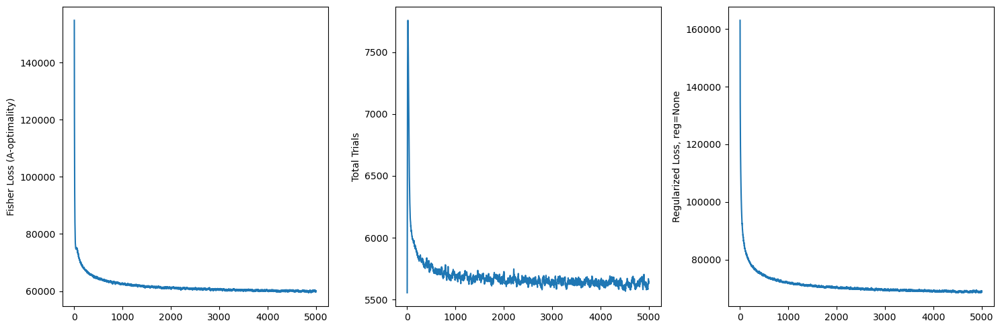

0.06895694301981876 0.06895694301981876


/tmp/ipykernel_16645/3869737655.py:110: RuntimeWarning: invalid value encountered in true_divide
  p_tmp = (p_new * T_new[np.newaxis, :, :] + probs_empirical * T_prev[np.newaxis, :, :]) / ((T_new + T_prev)[np.newaxis, :, :])
/tmp/ipykernel_16645/3869737655.py:123: RuntimeWarning: invalid value encountered in true_divide
  p_tmp_uniform = (p_new_uniform * T_new_uniform[np.newaxis, :, :] + probs_empirical_uniform * T_prev_uniform[np.newaxis, :, :]) / ((T_prev_uniform + T_new_uniform)[np.newaxis, :, :])


Setting up data...
Fitting dataset...
Calculating Jacobian...
Optimizing trials...
0
(DeviceArray(93446.13, dtype=float32), DeviceArray(5556.0713, dtype=float32), DeviceArray(98109.43, dtype=float32), DeviceArray(4663.2954, dtype=float32))
1
(DeviceArray(87695.31, dtype=float32), DeviceArray(5781.799, dtype=float32), DeviceArray(93495.89, dtype=float32), DeviceArray(5800.5757, dtype=float32))
2
(DeviceArray(82924.086, dtype=float32), DeviceArray(5753.705, dtype=float32), DeviceArray(88583.12, dtype=float32), DeviceArray(5659.0312, dtype=float32))
3
(DeviceArray(78874.89, dtype=float32), DeviceArray(5612.3584, dtype=float32), DeviceArray(83821.77, dtype=float32), DeviceArray(4946.8857, dtype=float32))
4
(DeviceArray(75375.39, dtype=float32), DeviceArray(5756.2046, dtype=float32), DeviceArray(81047.016, dtype=float32), DeviceArray(5671.6245, dtype=float32))
5
(DeviceArray(72311.81, dtype=float32), DeviceArray(5794.3203, dtype=float32), DeviceArray(78175.48, dtype=float32), DeviceArray(58

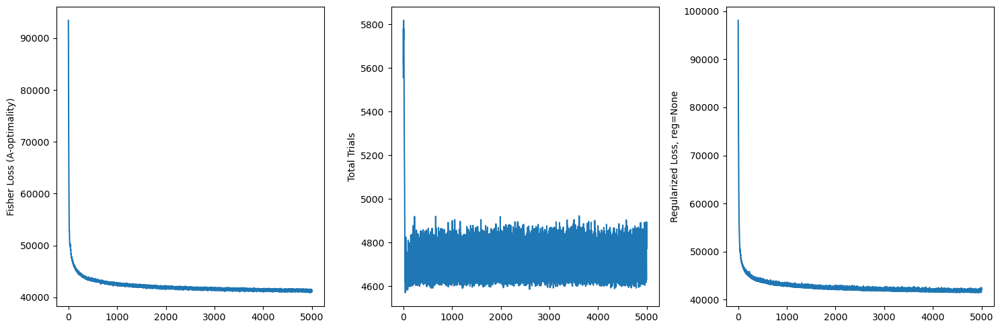

0.012426455503608973 0.056079137713188745


/tmp/ipykernel_16645/3869737655.py:110: RuntimeWarning: invalid value encountered in true_divide
  p_tmp = (p_new * T_new[np.newaxis, :, :] + probs_empirical * T_prev[np.newaxis, :, :]) / ((T_new + T_prev)[np.newaxis, :, :])


Setting up data...
Fitting dataset...


/tmp/ipykernel_16645/3869737655.py:123: RuntimeWarning: invalid value encountered in true_divide
  p_tmp_uniform = (p_new_uniform * T_new_uniform[np.newaxis, :, :] + probs_empirical_uniform * T_prev_uniform[np.newaxis, :, :]) / ((T_prev_uniform + T_new_uniform)[np.newaxis, :, :])


Calculating Jacobian...
Optimizing trials...
0
(DeviceArray(33700.523, dtype=float32), DeviceArray(5556.0713, dtype=float32), DeviceArray(35302.344, dtype=float32), DeviceArray(1601.8202, dtype=float32))
1
(DeviceArray(32999.934, dtype=float32), DeviceArray(5750.3164, dtype=float32), DeviceArray(34937.92, dtype=float32), DeviceArray(1937.9863, dtype=float32))
2
(DeviceArray(32606.355, dtype=float32), DeviceArray(5682.8584, dtype=float32), DeviceArray(34427.598, dtype=float32), DeviceArray(1821.2416, dtype=float32))
3
(DeviceArray(32708.963, dtype=float32), DeviceArray(5585.022, dtype=float32), DeviceArray(34360.887, dtype=float32), DeviceArray(1651.923, dtype=float32))
4
(DeviceArray(32530.46, dtype=float32), DeviceArray(5636.2773, dtype=float32), DeviceArray(34271.09, dtype=float32), DeviceArray(1740.6271, dtype=float32))
5
(DeviceArray(32194.225, dtype=float32), DeviceArray(5717.058, dtype=float32), DeviceArray(34074.652, dtype=float32), DeviceArray(1880.4286, dtype=float32))
6
(Devi

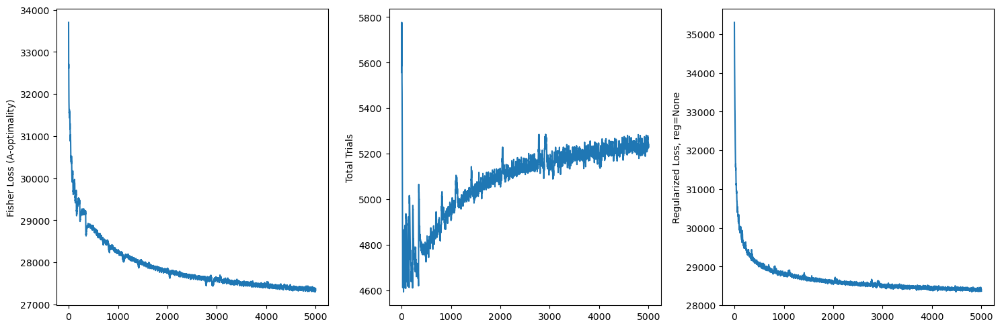

0.009306936784758878 0.05195060481379897


/tmp/ipykernel_16645/3869737655.py:110: RuntimeWarning: invalid value encountered in true_divide
  p_tmp = (p_new * T_new[np.newaxis, :, :] + probs_empirical * T_prev[np.newaxis, :, :]) / ((T_new + T_prev)[np.newaxis, :, :])


Setting up data...
Fitting dataset...


/tmp/ipykernel_16645/3869737655.py:123: RuntimeWarning: invalid value encountered in true_divide
  p_tmp_uniform = (p_new_uniform * T_new_uniform[np.newaxis, :, :] + probs_empirical_uniform * T_prev_uniform[np.newaxis, :, :]) / ((T_prev_uniform + T_new_uniform)[np.newaxis, :, :])


Calculating Jacobian...
Optimizing trials...
0
(DeviceArray(24389.613, dtype=float32), DeviceArray(5556.0713, dtype=float32), DeviceArray(25540.65, dtype=float32), DeviceArray(1151.0369, dtype=float32))
1
(DeviceArray(24044.861, dtype=float32), DeviceArray(5727.668, dtype=float32), DeviceArray(25409.295, dtype=float32), DeviceArray(1364.4338, dtype=float32))
2
(DeviceArray(23759.852, dtype=float32), DeviceArray(5628.743, dtype=float32), DeviceArray(25001.264, dtype=float32), DeviceArray(1241.4113, dtype=float32))
3
(DeviceArray(23510.81, dtype=float32), DeviceArray(5411.1895, dtype=float32), DeviceArray(24481.674, dtype=float32), DeviceArray(970.86237, dtype=float32))
4
(DeviceArray(23456.078, dtype=float32), DeviceArray(5498.431, dtype=float32), DeviceArray(24535.434, dtype=float32), DeviceArray(1079.3558, dtype=float32))
5
(DeviceArray(23415.107, dtype=float32), DeviceArray(5539.951, dtype=float32), DeviceArray(24546.098, dtype=float32), DeviceArray(1130.9899, dtype=float32))
6
(Devi

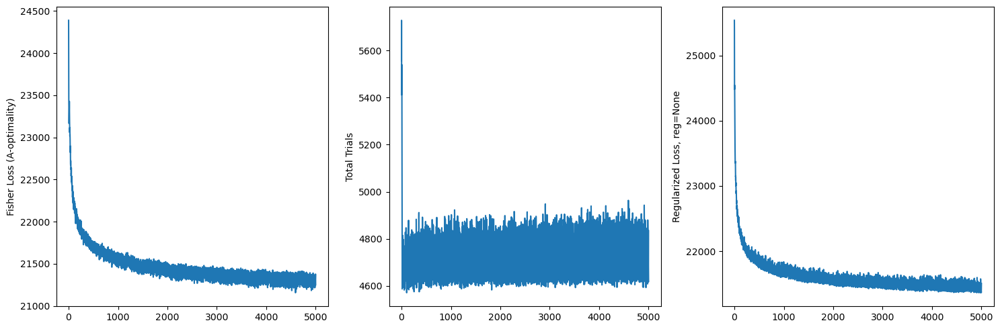

0.008036203418513655 0.0509105960386917


/tmp/ipykernel_16645/3869737655.py:110: RuntimeWarning: invalid value encountered in true_divide
  p_tmp = (p_new * T_new[np.newaxis, :, :] + probs_empirical * T_prev[np.newaxis, :, :]) / ((T_new + T_prev)[np.newaxis, :, :])


Setting up data...
Fitting dataset...


/tmp/ipykernel_16645/3869737655.py:123: RuntimeWarning: invalid value encountered in true_divide
  p_tmp_uniform = (p_new_uniform * T_new_uniform[np.newaxis, :, :] + probs_empirical_uniform * T_prev_uniform[np.newaxis, :, :]) / ((T_prev_uniform + T_new_uniform)[np.newaxis, :, :])


Calculating Jacobian...
Optimizing trials...
0
(DeviceArray(18970.47, dtype=float32), DeviceArray(5556.0713, dtype=float32), DeviceArray(19861.95, dtype=float32), DeviceArray(891.47876, dtype=float32))
1
(DeviceArray(18776.725, dtype=float32), DeviceArray(5704.44, dtype=float32), DeviceArray(19811.107, dtype=float32), DeviceArray(1034.3823, dtype=float32))
2
(DeviceArray(18650.086, dtype=float32), DeviceArray(5573.2266, dtype=float32), DeviceArray(19558.088, dtype=float32), DeviceArray(908.00214, dtype=float32))
3
(DeviceArray(18775.066, dtype=float32), DeviceArray(5333.3843, dtype=float32), DeviceArray(19452.06, dtype=float32), DeviceArray(676.9942, dtype=float32))
4
(DeviceArray(18794.719, dtype=float32), DeviceArray(5290.3154, dtype=float32), DeviceArray(19430.23, dtype=float32), DeviceArray(635.5117, dtype=float32))
5
(DeviceArray(18754.264, dtype=float32), DeviceArray(5278.382, dtype=float32), DeviceArray(19378.281, dtype=float32), DeviceArray(624.0177, dtype=float32))
6
(DeviceAr

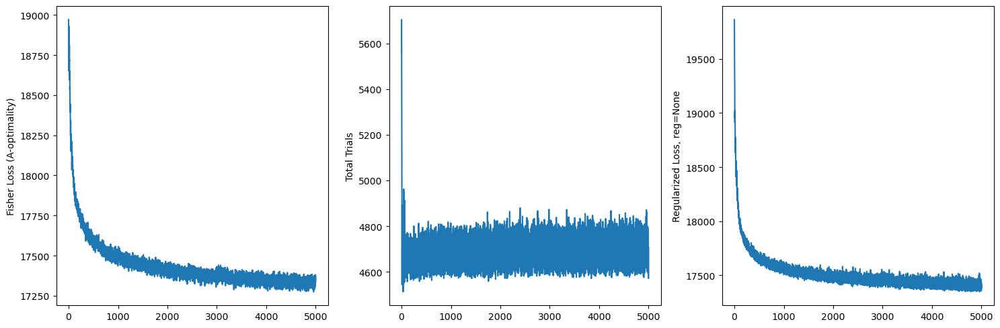

0.007561909572588222 0.04907559571160517


/tmp/ipykernel_16645/3869737655.py:110: RuntimeWarning: invalid value encountered in true_divide
  p_tmp = (p_new * T_new[np.newaxis, :, :] + probs_empirical * T_prev[np.newaxis, :, :]) / ((T_new + T_prev)[np.newaxis, :, :])
/tmp/ipykernel_16645/3869737655.py:123: RuntimeWarning: invalid value encountered in true_divide
  p_tmp_uniform = (p_new_uniform * T_new_uniform[np.newaxis, :, :] + probs_empirical_uniform * T_prev_uniform[np.newaxis, :, :]) / ((T_prev_uniform + T_new_uniform)[np.newaxis, :, :])


Setting up data...
Fitting dataset...
Calculating Jacobian...
Optimizing trials...
0
(DeviceArray(16020.295, dtype=float32), DeviceArray(5556.0713, dtype=float32), DeviceArray(16771.562, dtype=float32), DeviceArray(751.267, dtype=float32))
1
(DeviceArray(15888.626, dtype=float32), DeviceArray(5691.548, dtype=float32), DeviceArray(16749.857, dtype=float32), DeviceArray(861.2305, dtype=float32))
2
(DeviceArray(15793.236, dtype=float32), DeviceArray(5541.791, dtype=float32), DeviceArray(16532.912, dtype=float32), DeviceArray(739.676, dtype=float32))
3
(DeviceArray(15719.016, dtype=float32), DeviceArray(5265.279, dtype=float32), DeviceArray(16234.252, dtype=float32), DeviceArray(515.23676, dtype=float32))
4
(DeviceArray(15654.74, dtype=float32), DeviceArray(5301.577, dtype=float32), DeviceArray(16199.439, dtype=float32), DeviceArray(544.6994, dtype=float32))
5
(DeviceArray(15595.306, dtype=float32), DeviceArray(5240.419, dtype=float32), DeviceArray(16090.364, dtype=float32), DeviceArray(49

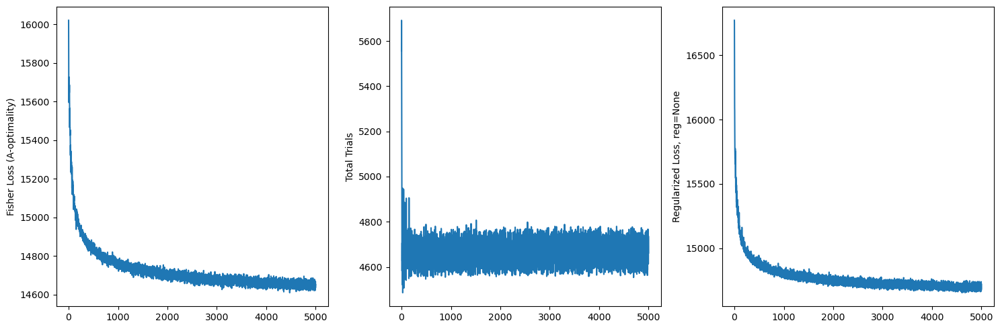

0.007143023852967039 0.04750008839967701


In [9]:
# total_budget = 50000
num_iters = 5

T_prev = np.zeros((amps_scan.shape[0], amps_scan.shape[1]), dtype=float)
budget = T_prev.shape[0] * T_prev.shape[1] * 0.25 #int(total_budget / num_iters)
reg = None # 20, 50
T_step_size = 0.05 # 0.05, 0.01
T_n_steps = 5000    # 5000

init_trials = 5
init_amps = 200
ms = [1, 2, 3, 4, 5, 6]
disambiguate = True
verbose = True
R2_cutoff = 0
prob_low = 1 / init_trials

for i in range(len(T_prev)):
    init_inds = np.random.choice(np.arange(len(T_prev[i]), dtype=int), size=init_amps,
                                 replace=False)
    T_prev[i][init_inds] = init_trials

# T_prev[:, np.where(np.count_nonzero(amps_scan[0], axis=1) <= 1)[0]] = init_trials
T_prev_uniform = deepcopy(T_prev)

probs_empirical = sample_spikes_array(probs_true_scan, T_prev, NUM_THREADS=24)
probs_empirical_uniform = deepcopy(probs_empirical)

performances = []
performances_uniform = []
num_samples = []
num_samples_uniform = []

iter_cnt = 0
while True:
    if iter_cnt == 0:
        T_new, w_inits_array, t_final, probs_curr, params_curr = fitting.fisher_sampling_1elec(
                                        probs_empirical, 
                                        T_prev, amps_scan,
                                        T_step_size=T_step_size,
                                        T_n_steps=T_n_steps,
                                        verbose=verbose, budget=budget, ms=ms, reg=reg,
                                        return_probs=True,
                                        disambiguate=disambiguate,
                                        R2_cutoff=R2_cutoff,
                                        min_prob=prob_low)

        performance = get_performance_array(params_true, probs_curr, probs_true_scan)
        performance_uniform = performance

        w_inits_array_uniform = deepcopy(w_inits_array)
        
    else:
        T_new, w_inits_array, t_final, probs_curr, params_curr = fitting.fisher_sampling_1elec(
                                        probs_empirical, 
                                        T_prev, amps_scan,
                                        T_step_size=T_step_size,
                                        T_n_steps=T_n_steps,
                                        verbose=verbose, budget=budget, ms=ms, reg=reg,
                                        return_probs=True,
                                        # t_final=t_final,
                                        w_inits_array=w_inits_array,
                                        disambiguate=disambiguate,
                                        R2_cutoff=R2_cutoff,
                                        min_prob=prob_low)
        
        performance = get_performance_array(params_true, probs_curr, probs_true_scan)

        input_list_uniform = fitting.generate_input_list(probs_empirical_uniform, amps_scan, 
                                                            T_prev_uniform, w_inits_array_uniform, prob_low,
                                                            disambiguate=disambiguate)

        pool = mp.Pool(processes=24)
        results_uniform = pool.starmap_async(fitting.fit_surface, input_list_uniform)
        mp_output_uniform = results_uniform.get()
        pool.close()

        params_curr_uniform = np.zeros((probs_empirical_uniform.shape[0], probs_empirical_uniform.shape[1]), dtype=object)
        w_inits_array_uniform = np.zeros((probs_empirical_uniform.shape[0], probs_empirical_uniform.shape[1]), dtype=object)
        probs_curr_uniform = np.zeros(probs_empirical_uniform.shape)

        cnt = 0
        for i in range(len(probs_empirical_uniform)):
            for j in range(len(probs_empirical_uniform[i])):
                params_curr_uniform[i][j] = mp_output_uniform[cnt][0]
                w_inits_array_uniform[i][j] = mp_output_uniform[cnt][1]
                
                probs_curr_uniform[i][j] = fitting.sigmoidND_nonlinear(
                                        sm.add_constant(amps_scan[j], has_constant='add'), 
                                        params_curr_uniform[i][j])

                cnt += 1

        performance_uniform = get_performance_array(params_true, probs_curr_uniform, probs_true_scan)
    
    print(performance, performance_uniform)
    
    performances.append(performance)
    performances_uniform.append(performance_uniform)
    
    num_samples.append(np.sum(T_prev))
    num_samples_uniform.append(np.sum(T_prev_uniform))

    iter_cnt += 1

    if iter_cnt > num_iters:
        break

    p_new = sample_spikes_array(probs_true_scan, T_new, NUM_THREADS=24)
    p_tmp = (p_new * T_new[np.newaxis, :, :] + probs_empirical * T_prev[np.newaxis, :, :]) / ((T_new + T_prev)[np.newaxis, :, :])
    T_tmp = T_new + T_prev

    p_tmp = np.nan_to_num(p_tmp, nan=0.5)

    probs_empirical = p_tmp
    T_prev = T_tmp
    
    random_extra = np.random.choice(len(T_new.flatten()), size=int(np.sum(T_new)), replace=True)
    T_new_uniform = np.array(np.bincount(random_extra, minlength=len(T_new.flatten())).astype(int).reshape(T_new.shape), dtype=float)
    # T_new_uniform = np.ones_like(T_prev_uniform, dtype=float)
    p_new_uniform = sample_spikes_array(probs_true_scan, T_new_uniform, NUM_THREADS=24)

    p_tmp_uniform = (p_new_uniform * T_new_uniform[np.newaxis, :, :] + probs_empirical_uniform * T_prev_uniform[np.newaxis, :, :]) / ((T_prev_uniform + T_new_uniform)[np.newaxis, :, :])
    T_tmp_uniform = T_prev_uniform + T_new_uniform

    p_tmp_uniform = np.nan_to_num(p_tmp_uniform, nan=0.5)

    probs_empirical_uniform = p_tmp_uniform
    T_prev_uniform = T_tmp_uniform

In [10]:
baseline_trials = 20
T_prev_baseline = np.ones_like(T_prev, dtype=float) * baseline_trials

probs_empirical_baseline = sample_spikes_array(probs_true_scan, T_prev_baseline, NUM_THREADS=24)

w_inits_array_baseline = np.zeros((probs_empirical_baseline.shape[0], probs_empirical_baseline.shape[1]), dtype=object)
for i in range(len(w_inits_array_baseline)):
    for j in range(len(w_inits_array_baseline[i])):
        w_inits = []

        for m in ms:
            w_init = np.array(np.random.normal(size=(m, amps_scan[j].shape[1]+1)))
            w_inits.append(w_init)

        w_inits_array_baseline[i][j] = w_inits

input_list_baseline = fitting.generate_input_list(probs_empirical_baseline, amps_scan, T_prev_baseline, w_inits_array_baseline, 1 / baseline_trials,
                                                    disambiguate=disambiguate)

pool = mp.Pool(processes=24)
results_baseline = pool.starmap_async(fitting.fit_surface, input_list_baseline)
mp_output_baseline = results_baseline.get()
pool.close()

params_curr_baseline = np.zeros((probs_empirical_baseline.shape[0], probs_empirical_baseline.shape[1]), dtype=object)
w_inits_array_baseline = np.zeros((probs_empirical_baseline.shape[0], probs_empirical_baseline.shape[1]), dtype=object)
probs_curr_baseline = np.zeros(probs_empirical_baseline.shape)

cnt = 0
for i in range(len(probs_empirical_baseline)):
    for j in range(len(probs_empirical_baseline[i])):
        params_curr_baseline[i][j] = mp_output_baseline[cnt][0]
        w_inits_array_baseline[i][j] = mp_output_baseline[cnt][1]
        
        probs_curr_baseline[i][j] = fitting.sigmoidND_nonlinear(
                                sm.add_constant(amps_scan[j], has_constant='add'), 
                                params_curr_baseline[i][j])

        cnt += 1

performance_baseline = get_performance_array(params_true, probs_curr_baseline, probs_true_scan)

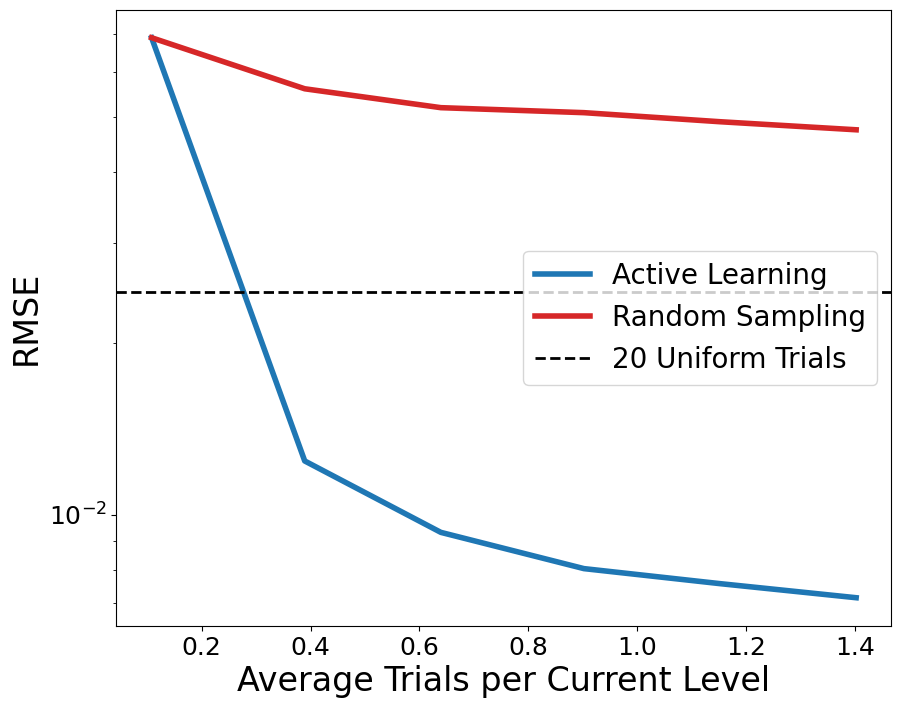

In [11]:
plt.figure(figsize=(10, 8))

plt.semilogy(np.array(num_samples)/T_prev.shape[0]/T_prev.shape[1], performances, linewidth=4, c='tab:blue', label='Active Learning')
plt.semilogy(np.array(num_samples_uniform)/T_prev_uniform.shape[0]/T_prev_uniform.shape[1], performances_uniform, linewidth=4, c='tab:red', label='Random Sampling')

plt.axhline(performance_baseline, c='k', linestyle='--', linewidth=2, label=f'{baseline_trials} Uniform Trials')
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.xlabel('Average Trials per Current Level', fontsize=24)
plt.ylabel(r'RMSE', fontsize=24)
plt.legend(fontsize=20)

plt.savefig(f'triplet_AL_full_{dataset}.png', dpi=300)

16 1
[[-5.69708599  0.41743353  0.60845776  2.10579574]
 [-5.69708599  2.21817157  0.41890777 -0.3483808 ]
 [-5.69708599 -1.89809637 -0.84003736 -1.56590854]]
401


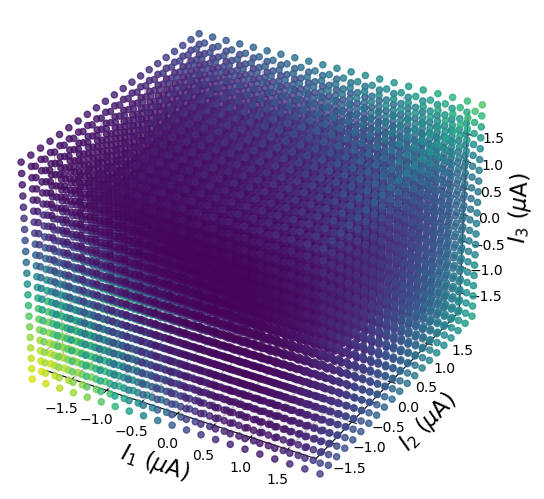

[[-6.00281195  2.42207951  0.42053895 -0.3294017 ]
 [-5.69708599 -1.85571151 -0.84838814 -1.57642313]
 [-5.69708599  0.3895336   0.64466027  2.11402937]]


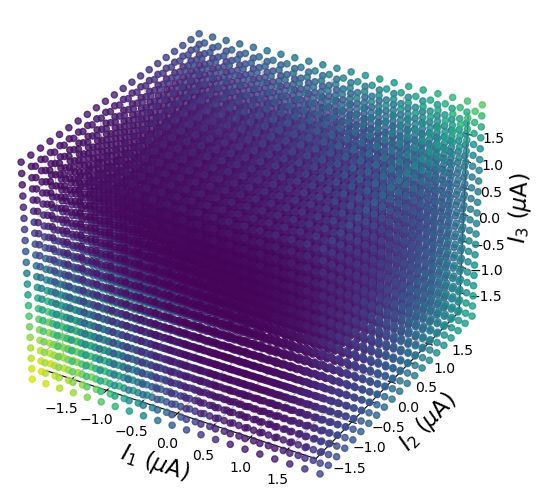

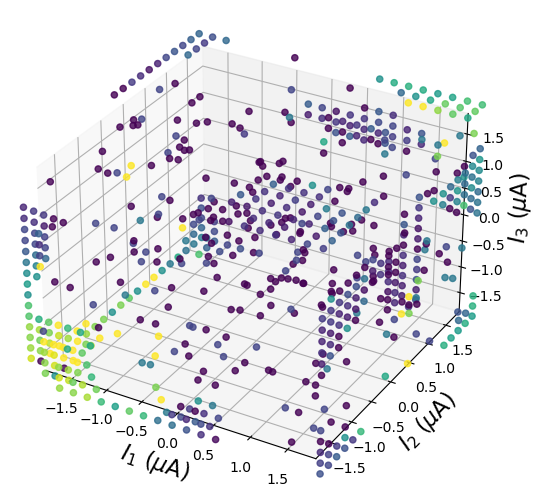

197 2
[[ -6.49915737   1.38658668   1.96403613  -0.54944828]
 [-19.99991558  -3.35580688  -8.62274698 -10.        ]
 [-19.38684288   3.41941792   8.94646268   7.56441624]
 [-16.60805949  -1.51587676 -10.          -0.51303243]]
711


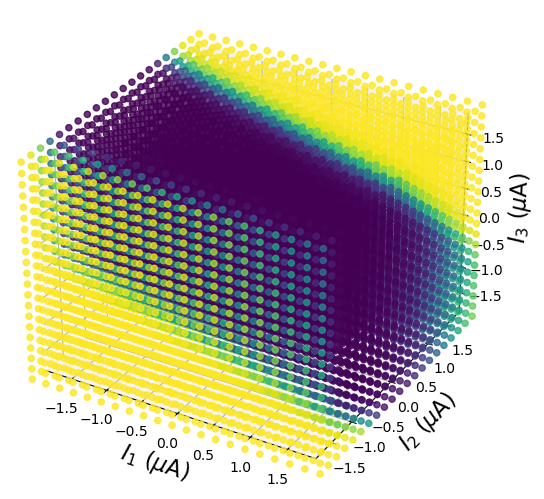

[[-19.43901576   3.42294988   8.90543439   7.69510834]
 [ -6.51581611   1.39904727   1.90842426  -0.60196047]
 [-18.94108595  -3.20338099  -8.24549401  -9.44756127]
 [-16.67488326  -1.52126841  -9.99997119  -0.47214042]]


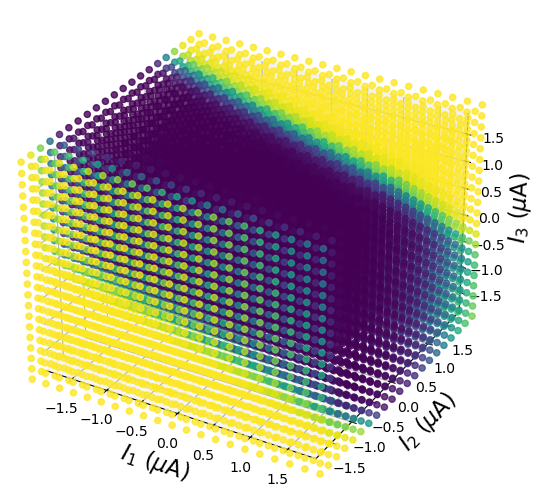

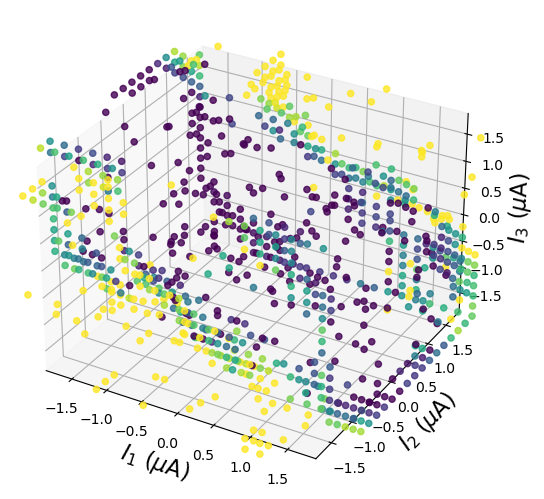

212 2
[[-7.15236172  3.99447439  3.71144626  5.83997178]
 [-8.4917808  -4.83791847 -4.73380923 -8.22548029]]
771


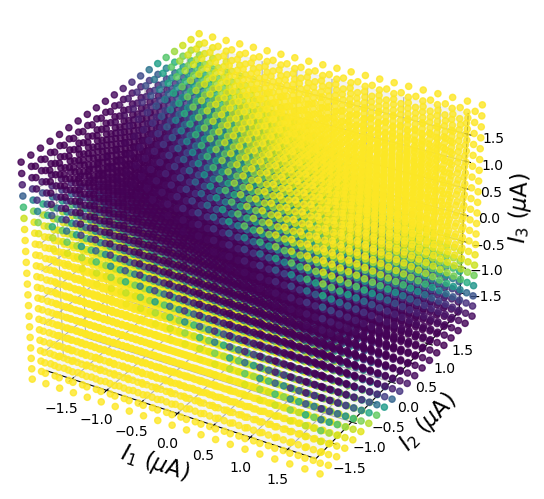

[[-7.8861589  -4.5770789  -4.40990488 -7.69357924]
 [-6.78491643  3.81014698  3.54173921  5.58906725]]


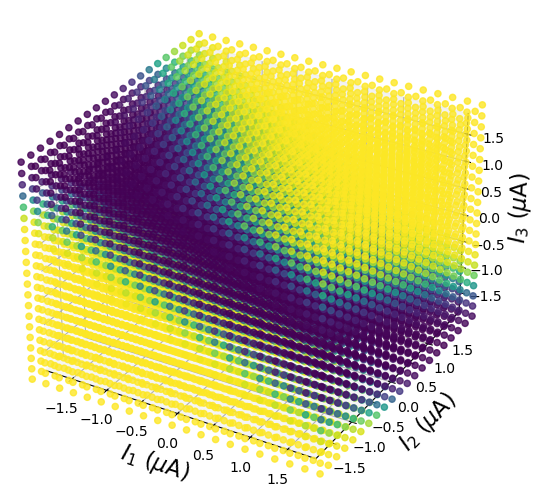

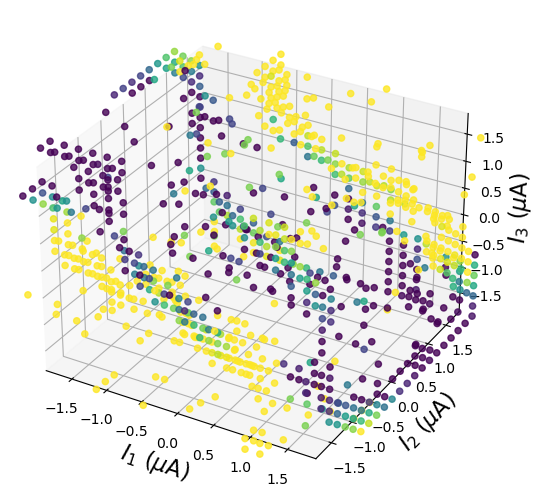

220 2
[[-6.5279853  -6.44986803 -3.3803989  -3.18801176]
 [-5.29078277  4.60037745  2.21347706  2.12876312]]
1033


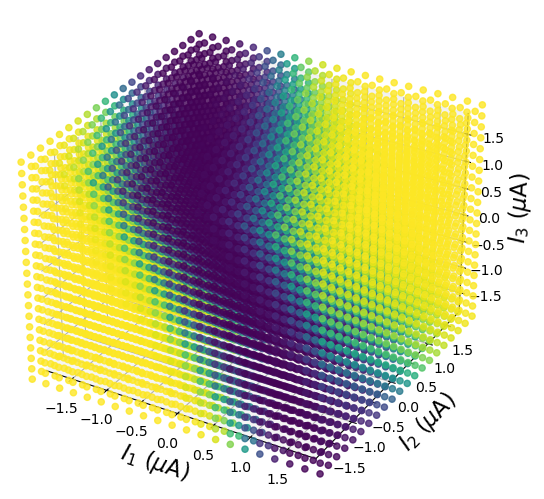

[[-5.42616306  4.75306428  2.29889784  2.16849312]
 [-6.49132188 -6.42802031 -3.38401257 -3.17001641]]


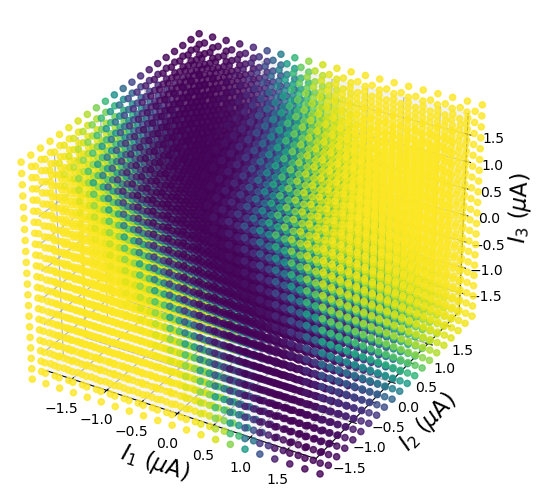

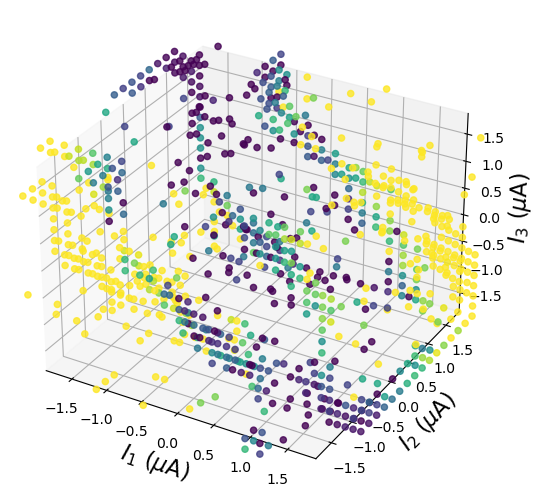

In [12]:
# CHECK DATASET IF NEEDED
from mpl_toolkits.mplot3d import Axes3D

for i in range(len(all_probs)):
    for j in range(len(all_probs[i])):
        if ~np.all(params_true[i][j][:, 0] == -np.inf):

            print(cells[i], j+1)
            print(params_true[i][j])
            print(len(np.where(all_probs[i][j][clean_inds_array[i][j]] >= spont_limit)[0]))

            sampled_inds = np.where(T_prev[j] > 0)[0]
            
            fig = plt.figure(0)
            fig.clear()
            ax = Axes3D(fig, auto_add_to_figure=False)
            fig.add_axes(ax)
            plt.xlabel(r'$I_1$ ($\mu$A)', fontsize=16)
            plt.ylabel(r'$I_2$ ($\mu$A)', fontsize=16)
            plt.xlim(-1.8, 1.8)
            plt.ylim(-1.8, 1.8)
            ax.set_zlim(-1.8, 1.8)
            ax.set_zlabel(r'$I_3$ ($\mu$A)', fontsize=16)

            scat = ax.scatter(amps_scan[j][:, 0], 
                              amps_scan[j][:, 1],
                              amps_scan[j][:, 2], marker='o', 
                              c=probs_true_scan[i][j], s=20, alpha=0.8, vmin=0, vmax=1)
            plt.show()


            print(params_curr[i][j])
            fig = plt.figure(1)
            fig.clear()
            ax = Axes3D(fig, auto_add_to_figure=False)
            fig.add_axes(ax)
            plt.xlabel(r'$I_1$ ($\mu$A)', fontsize=16)
            plt.ylabel(r'$I_2$ ($\mu$A)', fontsize=16)
            plt.xlim(-1.8, 1.8)
            plt.ylim(-1.8, 1.8)
            ax.set_zlim(-1.8, 1.8)
            ax.set_zlabel(r'$I_3$ ($\mu$A)', fontsize=16)

            scat = ax.scatter(amps_scan[j][:, 0], 
                              amps_scan[j][:, 1],
                              amps_scan[j][:, 2], marker='o', 
                              c=probs_curr[i][j], s=20, alpha=0.8, vmin=0, vmax=1)
            plt.show()

            fig = plt.figure(1)
            fig.clear()
            ax = Axes3D(fig, auto_add_to_figure=False)
            fig.add_axes(ax)
            plt.xlabel(r'$I_1$ ($\mu$A)', fontsize=16)
            plt.ylabel(r'$I_2$ ($\mu$A)', fontsize=16)
            plt.xlim(-1.8, 1.8)
            plt.ylim(-1.8, 1.8)
            ax.set_zlim(-1.8, 1.8)
            ax.set_zlabel(r'$I_3$ ($\mu$A)', fontsize=16)

            scat = ax.scatter(amps_scan[j][sampled_inds, 0], 
                              amps_scan[j][sampled_inds, 1],
                              amps_scan[j][sampled_inds, 2], marker='o', 
                              c=probs_empirical[i][j][sampled_inds], s=20, alpha=0.8, vmin=0, vmax=1)
            plt.show()

            input()